# **Fall Detection**
###### Staircase, Ladder, Escalator, Steps, etc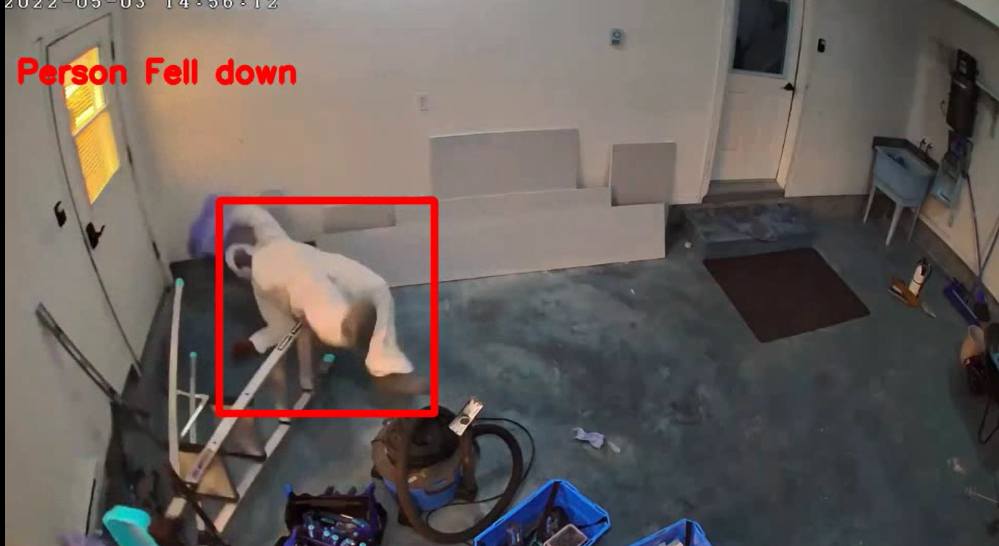

----

I have a 2 main files :
- main.py   ->  Detects falls in the Video (using YOLOv7)
- main2.py  ->  Detects if the fall was specifically from stairs (using OWL-ViT)

----

## **Algorithm**

Only a part of the code is displaye here. Please do visit the other files in the Github Repo.

Also the resultant videos are present in the github repo.

(For object detection, the output is produced in seconds hence run main2.py for it)

In [ ]:
def fall_detection(poses, image):
    global falls_boxs
    is_fall = False
    bbox = None

    for pose in poses:
        xmin, ymin = (pose[2] - pose[4] / 2), (pose[3] - pose[5] / 2)
        xmax, ymax = (pose[2] + pose[4] / 2), (pose[3] + pose[5] / 2)

        left_shoulder_y = pose[23]
        left_shoulder_x = pose[22]
        right_shoulder_y = pose[26]
        left_body_y = pose[41]
        left_body_x = pose[40]
        right_body_y = pose[44]

        len_factor = math.sqrt(((left_shoulder_y - left_body_y) ** 2 + (left_shoulder_x - left_body_x) ** 2))
        left_foot_y = pose[53]
        right_foot_y = pose[56]
        dx = int(xmax) - int(xmin)
        dy = int(ymax) - int(ymin)
        difference = dy - dx

        if left_shoulder_y > left_foot_y - len_factor and left_body_y > left_foot_y - (len_factor / 2) and left_shoulder_y > left_body_y - (len_factor / 2) or (right_shoulder_y > right_foot_y - len_factor and right_body_y > right_foot_y - (len_factor / 2) and right_shoulder_y > right_body_y - (len_factor / 2)) or difference < 0:
            is_fall = True
            bbox = (xmin, ymin, xmax, ymax)
            falls_boxs.append((xmin, ymin, xmax, ymax))
            break

    return is_fall, bbox

The function then checks various conditions to determine if a fall has occurred. These conditions are based on the relative positions of key points, such as shoulders, hips, and feet. Specifically:
- It calculates the length factor, which is the distance between the left shoulder and left hip. This is used as a reference length for detecting falls.
- It checks if the left shoulder is below the left foot by at least the length factor, indicating a potential fall.
- It checks if the left hip is below the left foot by at least half the length factor, further confirming the fall.
- It checks if the difference between the width and height of the bounding box is negative, which may indicate a sudden change in posture, also        suggesting a fall.
<br>

If any of the conditions for a fall are met, the function sets the is_fall flag to True and records the bounding box (bbox) of the detected fall. The bounding box coordinates are appended to the global list falls_boxs, which presumably stores bounding boxes of all detected falls.

----

## **Zero Shot Object Detection**

This code continuously reads frames from a video stream. For each frame, it applies object detection using OwlViT to identify objects like stairs, ladders, escalators, and steps. After detecting these objects, it checks if any of them intersect with previously detected bounding boxes, which are stored in a CSV file and represent falls. If an intersection is found, it prints a message indicating that a fall has been detected from the object. (example : Fall from Ladder)

In [ ]:
while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Object detection with OwlViT
    image_pil = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    texts = [["stairs", "ladder", "escalator", "steps"]]
    inputs = processor(text=texts, images=image_pil, return_tensors="pt")
    outputs = model_vit(**inputs)
    target_sizes = torch.Tensor([image_pil.size[::-1]])
    results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_sizes, threshold=0.1)
    text = texts[0]
    boxes, scores, labels = results[0]["boxes"], results[0]["scores"], results[0]["labels"]

    # Draw rectangles for OwlViT object detection
    for box, score, label in zip(boxes, scores, labels):
        box = [int(i) for i in box.tolist()]
        print(box)
        intersection = check_intersection_with_csv(csv_file, box)
        print(intersection)
        print(f"Detected {text[label]} with confidence {round(score.item(), 3)} at location {box}")
        cv2.rectangle(frame, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 2)
        cv2.putText(frame, f"{text[label]}: {score:.2f}", (box[0], box[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                    (0, 255, 0), 2)

        # Check if intersection is detected and print the message
        if intersection:
            print(f"Fall detected from {text[label]}")
            cv2.putText(frame, f"Fall detected from {text[label]}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    # Show frame
    cv2.imshow('frame', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

In [ ]:
def check_intersection_with_csv(csv_file, box2):
    box1 = read_boxes_from_csv(csv_file)
    xmin2, ymin2, xmax2, ymax2 = box2

    for box in box1:
        xmin1, ymin1, xmax1, ymax1 = box
        # Check if boxes intersect along the x-axis
        x_intersect = (xmin1 <= xmax2) and (xmax1 >= xmin2)
        # Check if boxes intersect along the y-axis
        y_intersect = (ymin1 <= ymax2) and (ymax1 >= ymin2)
        # If both x and y intersections occur, the boxes intersect or touch
        if x_intersect and y_intersect:
            return True

    return False

----

# **Readme**

- So basically this code gets a video as an input, take few minutes to process and detect falls. The falls are then marked on the video itself and saved.
- It also stores the coordinates of the bounding boxes surrounding the fall. (4coordinates - xmin, ymin, xmax, ymax)
- Then this video output is then fed to main2.py, that is the ZeroShot process where it checks for objects like Stairs, Ladders, steps etc.
- When these objects are identified, their bounding coordinates are taken and compared to find any interaction with earlier found coordinates. If any then the fall was from that object specifically.

### Fall Detection

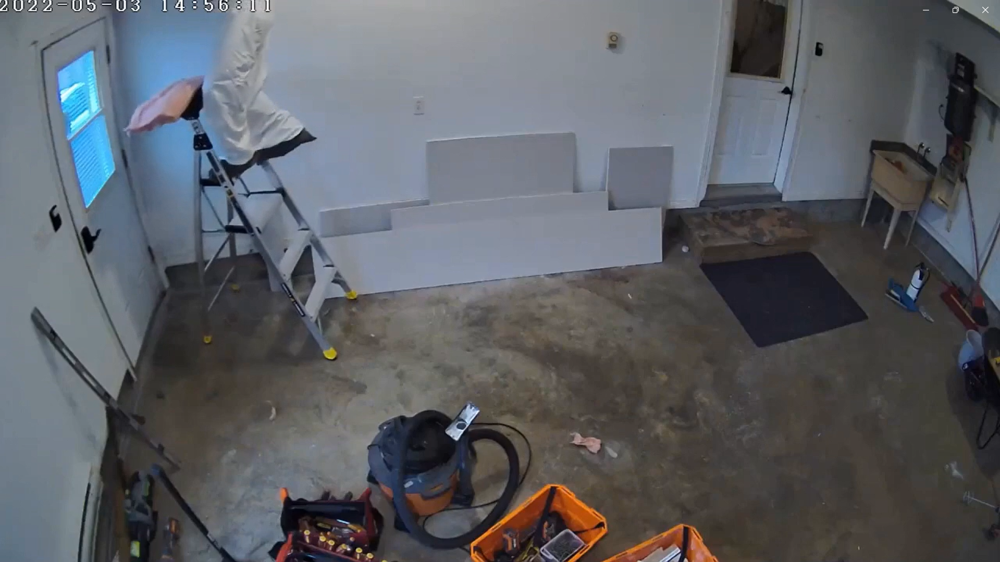

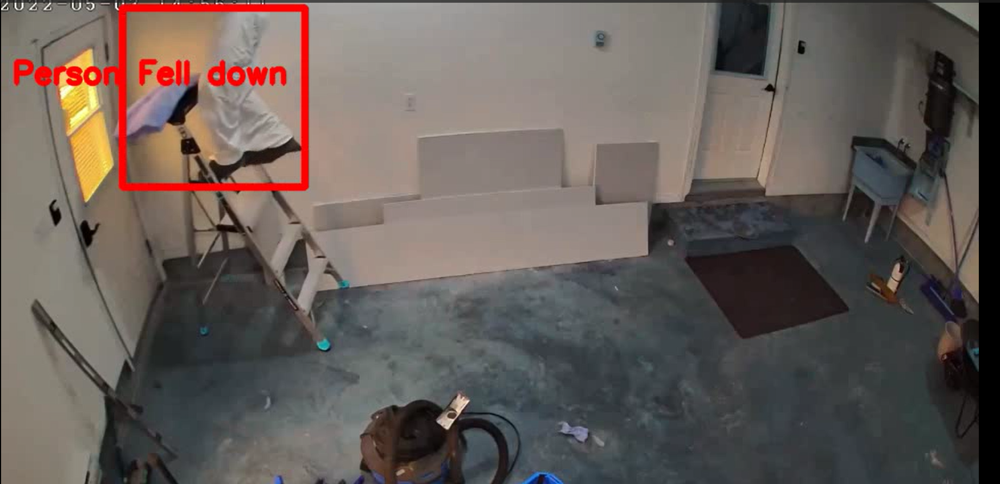

### Object Detection

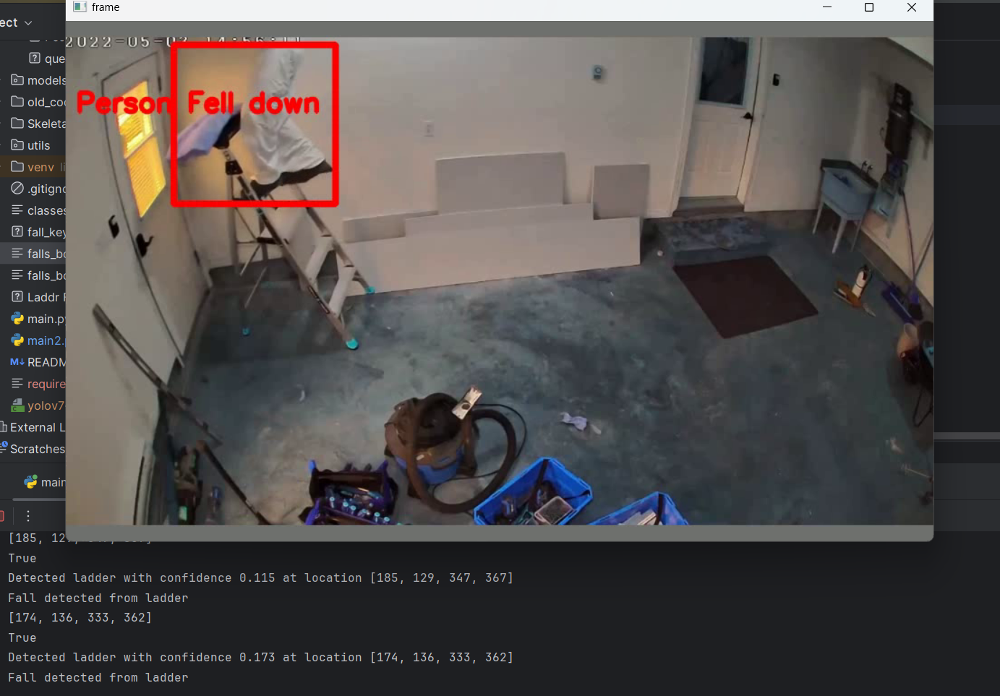

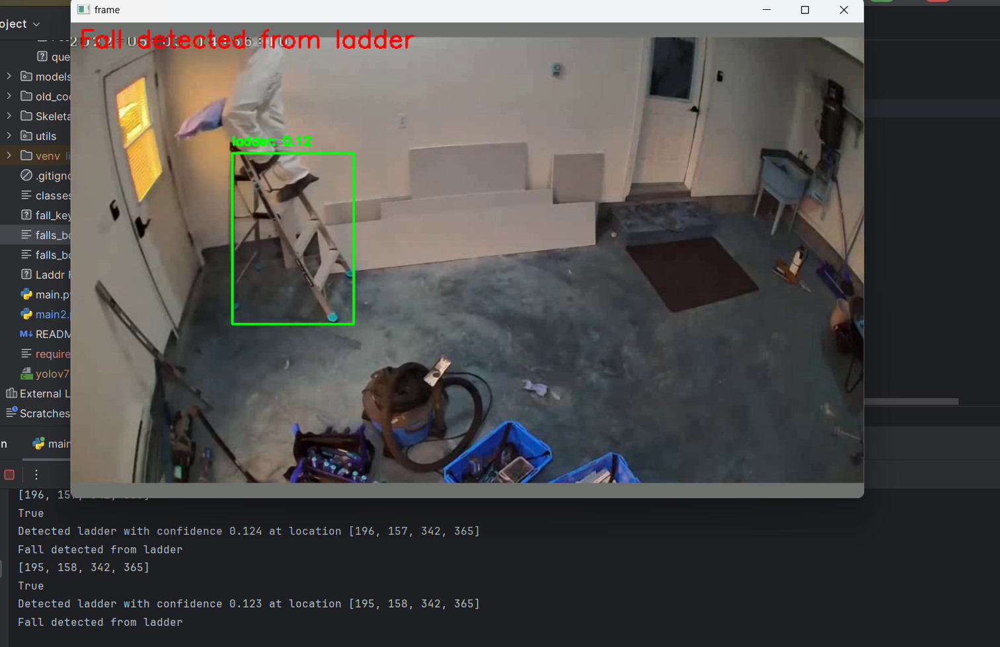

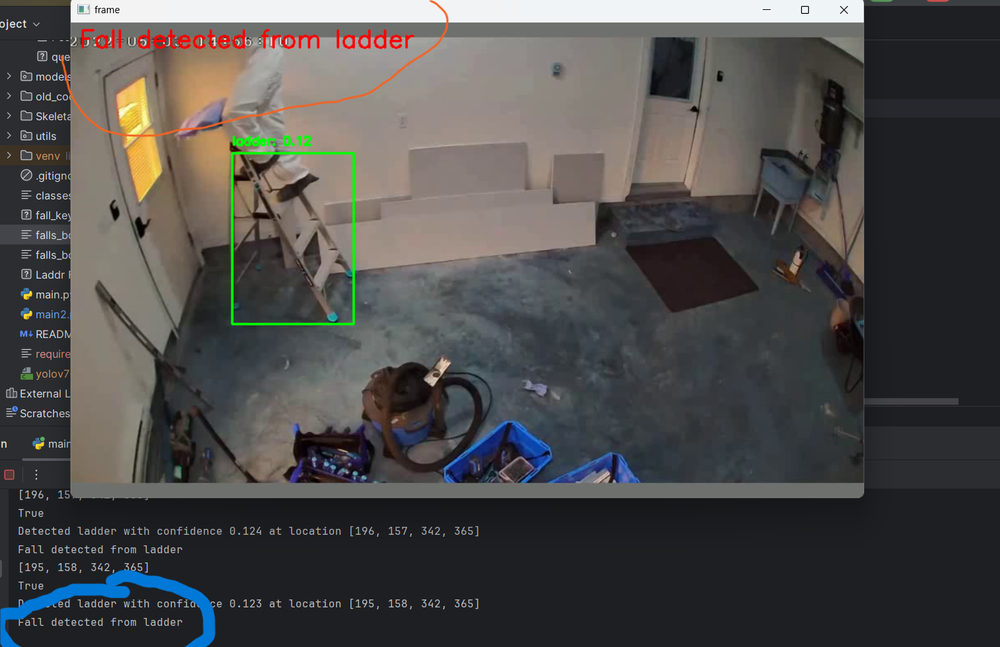

----

# **Skeletal solution**

### Training Phase:

1. **Data Preparation**:
   - Collect a dataset of video clips containing instances of falls and non-fall activities. Ensure each video clip is labeled accordingly.
   - Split the dataset into training, validation, and test sets.

2. **Model Selection**:
   - Using a combination of MediaPipe for pose estimation and OwlViT for object detection. Ensure the pose estimation model provides accurate keypoints for detecting falls, and the object detection model can effectively identify objects related to falls (e.g., people falling, stairs, ladders).

3. **Model Training**:
   - Train the models separately. For MediaPipe pose estimation, use annotated videos to train the model to accurately detect key points. For OwlViT object detection, train the model to recognize objects related to falls (e.g., people, stairs, ladders).
   - Fine-tune the pre-trained OwlViT model if necessary, especially if your dataset is small or if you need to adapt it to specific fall-related objects.

4. **Model Evaluation**:
   - Evaluate the trained models on the validation set to assess their performance.
   - Calculate metrics such as accuracy, precision, recall, and F1-score to measure the models' effectiveness.

### Prediction Phase:

1. **Data Preparation**:
   - Obtain video clips or live video streams for fall detection.

2. **Pose Estimation and Object Detection**:
   - Use MediaPipe for pose estimation to detect human poses in each frame of the video.
   - Use OwlViT for object detection to identify objects related to falls, such as people, stairs, or ladders.

3. **Fall Detection**:
   - Implement a fall detection algorithm based on the detected poses and objects.
   - Use the poses to analyze the body posture and movements indicative of a fall (e.g., sudden changes in orientation or position).
   - Use the detected objects to identify fall-related scenarios (e.g., a person falling near stairs or ladders).

4. **Visualization and Output**:
   - Visualize the results of the fall detection algorithm, such as by overlaying bounding boxes or annotations on the input video.
   - Output the final results of fall detection, which could include saving annotated video clips, generating reports, or triggering alerts in real-time systems.

By following this approach, I developed a fall detection system that leverages yolo, pose estimation and object detection to accurately identify instances of falls in video data.

----

Others method were given a try to ! Like getting the checkpoints and giving it to a Model to train on those values and then predict the fall.

Accuracy  - 88.01%

Precision - 89.8%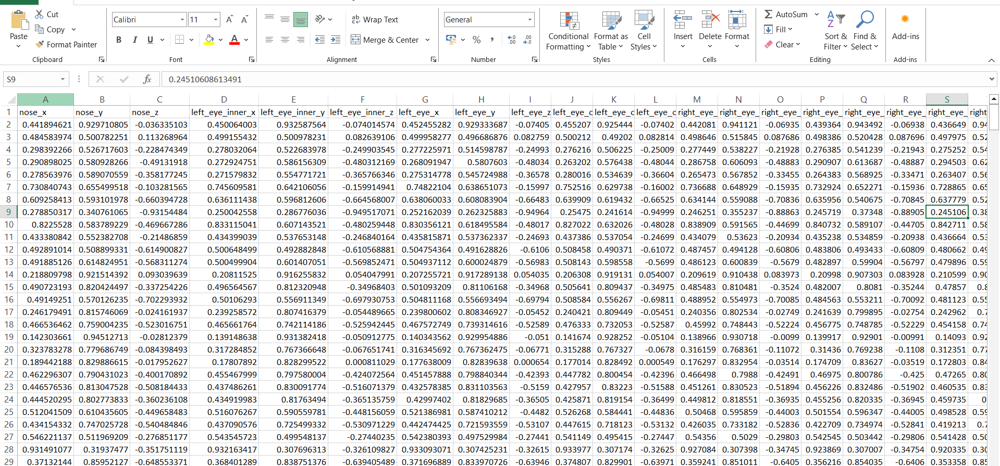

In [ ]:
# SVM Model


import os
import pickle
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

class SVMModelc:

    def bestModel(self):

        data = pd.read_csv(self.dataset_file)

        X = data.iloc[:, :-1]
        Y = data.iloc[:, -1]

        X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

        """
        param_grid = {
            'C': [0.1, 1, 10],
            'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
            'gamma': [0.01, 0.1, 1],
            'degree': [2, 3, 4]
        }
        """

        #grid_search = GridSearchCV(SVC(), param_grid, cv=5, scoring='accuracy')
        grid_search = SVC(C=10, gamma=1, kernel='poly') # The best model
        grid_search.fit(X_train, y_train)

        #best_params = grid_search.best_params_

        #best_svm = SVC(**best_params)
        #best_svm.fit(X_train, y_train)
        y_pred = grid_search.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)

        #print(best_params)
        print(accuracy)

        return grid_search

    def __init__(self, dataset_file):
        self.dataset_file = dataset_file
        self.svmodel()

    def svmodel(self):

        self.data = pd.read_csv(self.dataset_file)

        X = self.data.iloc[:, :-1]
        Y = self.data.iloc[:, -1]

        X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

        self.best_svm = self.bestModel()
        self.best_svm.fit(X_train, y_train)

        y_pred = self.best_svm.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        precision = precision_score(y_test, y_pred, average='weighted')

        print("Accuracy:", accuracy)
        print("F1 Score:", f1)
        print("Recall Score:", recall)
        print("Precision Score:", precision)

    def save_model(self, model_filename):
        pickle.dump(self.best_svm, open(model_filename, 'wb'))

    def load_model(self, model_filename):
        self.best_svm = pickle.load(open(model_filename, 'rb'))


data = pd.read_csv(r"C:\Users\deek\Documents\My Docs\College\Projects\StaircaseFall-detection\data\keypoints_data.csv")

svm0 = SVMModelc(r'C:\Users\deek\Documents\My Docs\College\Projects\StaircaseFall-detection\data\keypoints_data.csv')
# svm0.save_model('model2.pkl')

with open('model2.pkl', 'rb') as f:
    svm = pickle.load(f)

for i in range(len(data)):
    first_row = data.iloc[i, :-1]
    first_row_reshaped = first_row.values.reshape(1, -1)
    result = svm.predict(first_row_reshaped)
    print(f"Prediction for row {i}: {result}")

---

Theres a lot of coding here.

Hence a chance to explain my code would really be appreciated.

Thank you for giving me this oppurtunity !

--   VK Deeksha (21pd37)

----